<a href="https://colab.research.google.com/github/minadreamer/California-Property-Insights/blob/master/faster_rcnn_R101.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ------------------------------------------------------------
# AI for Archaeological Object Detection — Workshop Notebook
# Author: Mina Jambajantsan, Max Planck Institute of Geoanthropology
# ------------------------------------------------------------
# This notebook demonstrates how a pre-trained Faster R-CNN model with Resnet 101 backbone
# can be used to detect Bronze Age burial mounds on drone orthomosaics.
# ------------------------------------------------------------

## 1. Setup environment.   
Install Detectron2 and required libraries.

In [1]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu121/torch2.5/index.html
!pip install tqdm pillow

Looking in indexes: https://download.pytorch.org/whl/cu121
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu121/torch2.5/index.html
ERROR: Could not find a version that satisfies the requirement detectron2 (from versions: none)
ERROR: No matching distribution found for detectron2


In [2]:
# Ensure Detectron2 is available

try:
    import detectron2
    print("Detectron2 already installed.")
except Exception as e:
    print("Installing Detectron2 from source…")
    # This usually works on Colab; takes a few minutes
    !pip -q install "git+https://github.com/facebookresearch/detectron2.git"


Installing Detectron2 from source…
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.5/83.5 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 52.5 MB/s eta 0:00:00


In [3]:
# for next time run this instead of the next 2 cells
# mounts Drive

# unzips tiles_jpg.zip and export_ready.zip

# auto-detects the right image folder (handles nested tiles_jpg/tiles_jpg)

# sets CONFIG_PATH, WEIGHTS_PATH, IMG_DIR

# sanity-checks everything and shows quick counts

# ==== Colab one-click setup: mount, unzip, set paths, sanity checks ====
from google.colab import drive
drive.mount('/content/drive')

import os, glob, zipfile, shutil, sys
from pathlib import Path

# ---- 1) Locations on Drive (edit if your zips live elsewhere) ----
DRIVE_TILES_ZIP = "/content/drive/MyDrive/tiles_jpg.zip"
DRIVE_MODEL_ZIP = "/content/drive/MyDrive/export_ready.zip"

# ---- 2) Local targets in Colab ----
TILES_ROOT = Path("/content/tiles_jpg")
MODEL_ROOT = Path("/content/model_bundle")

TILES_ROOT.mkdir(parents=True, exist_ok=True)
MODEL_ROOT.mkdir(parents=True, exist_ok=True)

def unzip(zip_path, out_dir):
    assert os.path.exists(zip_path), f"Missing zip: {zip_path}"
    print(f"Unzipping {zip_path} -> {out_dir}")
    !unzip -q "{zip_path}" -d "{out_dir}"

# Unzip both bundles
unzip(DRIVE_TILES_ZIP, str(TILES_ROOT))
unzip(DRIVE_MODEL_ZIP, str(MODEL_ROOT))

# ---- 3) Resolve IMG_DIR (handle nested folders like tiles_jpg/tiles_jpg) ----
# Find a directory under TILES_ROOT that actually contains images
img_exts = (".jpg", ".jpeg", ".png", ".tif", ".tiff")
candidate_dirs = []
for p in TILES_ROOT.rglob("*"):
    if p.is_dir():
        has_imgs = any(Path(p).glob("*.jpg")) or any(Path(p).glob("*.png")) or any(Path(p).glob("*.jpeg")) or any(Path(p).glob("*.tif")) or any(Path(p).glob("*.tiff"))
        if has_imgs:
            candidate_dirs.append(p)

if not candidate_dirs:
    raise FileNotFoundError("No image-containing folder found under /content/tiles_jpg. "
                            "Check the zip structure or path.")

# Heuristic: pick the *shallowest* folder that has images
IMG_DIR = str(sorted(candidate_dirs, key=lambda p: len(p.parts))[0])

# ---- 4) Resolve CONFIG_PATH & WEIGHTS_PATH (supports foldered or flat zip) ----
config_candidates  = list(MODEL_ROOT.rglob("config_inference.yaml")) + list(MODEL_ROOT.rglob("config.yaml"))
weights_candidates = list(MODEL_ROOT.rglob("model_final.pth"))

assert weights_candidates, "model_final.pth not found in export_ready.zip"
WEIGHTS_PATH = str(weights_candidates[0])

if not config_candidates:
    raise FileNotFoundError("No config_inference.yaml (or config.yaml) found in export_ready.zip")
CONFIG_PATH = str(config_candidates[0])

# ---- 5) Quick sanity checks ----
num_imgs = sum(1 for _ in Path(IMG_DIR).glob("*") if _.suffix.lower() in img_exts)
print("\n✅ Setup complete")
print("CONFIG_PATH :", CONFIG_PATH)
print("WEIGHTS_PATH:", WEIGHTS_PATH)
print("IMG_DIR     :", IMG_DIR)
print(f"Image files : {num_imgs}")

assert os.path.exists(CONFIG_PATH)
assert os.path.exists(WEIGHTS_PATH)
assert num_imgs > 0, f"No images found in {IMG_DIR}"

# Optional: show GPU
print("\nGPU check:")
!nvidia-smi || true


Mounted at /content/drive
Unzipping /content/drive/MyDrive/tiles_jpg.zip -> /content/tiles_jpg
Unzipping /content/drive/MyDrive/export_ready.zip -> /content/model_bundle

✅ Setup complete
CONFIG_PATH : /content/model_bundle/export_ready/config_inference.yaml
WEIGHTS_PATH: /content/model_bundle/export_ready/model_final.pth
IMG_DIR     : /content/tiles_jpg/tiles_jpg
Image files : 22284

GPU check:
Wed Nov  5 08:52:02 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|================

In [4]:

# Unzip model bundle
!mkdir -p /content/model_bundle
!unzip -q /content/drive/MyDrive/export_ready.zip -d /content/model_bundle

# Set paths
CONFIG_PATH  = "/content/model_bundle/export_ready/config_inference.yaml"
WEIGHTS_PATH = "/content/model_bundle/export_ready/model_final.pth"
IMG_DIR      = "/content/tiles_jpg/tiles_jpg"   # your tiles folder from tiles_jpg.zip

import os
assert os.path.exists(CONFIG_PATH), CONFIG_PATH
assert os.path.exists(WEIGHTS_PATH), WEIGHTS_PATH
print("✅ Model bundle ready for inference!")


replace /content/model_bundle/export_ready/config_inference.yaml? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/model_bundle/export_ready/model_final.pth? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
✅ Model bundle ready for inference!


In [5]:
!find /content/tiles_jpg -maxdepth 3 -type d


/content/tiles_jpg
/content/tiles_jpg/__MACOSX
/content/tiles_jpg/__MACOSX/tiles_jpg
/content/tiles_jpg/tiles_jpg
/content/tiles_jpg/tiles_jpg/rejected


Found 22284 tiles


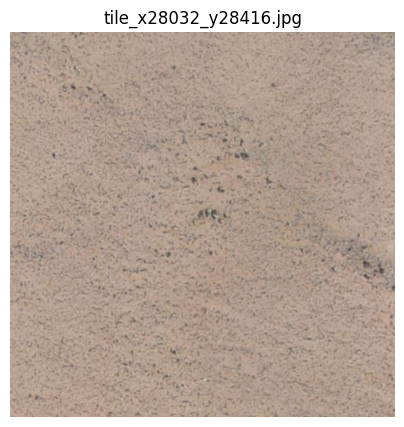

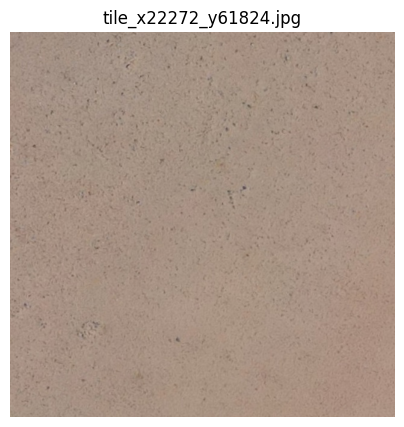

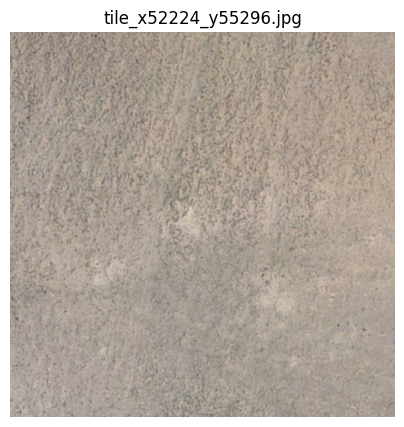

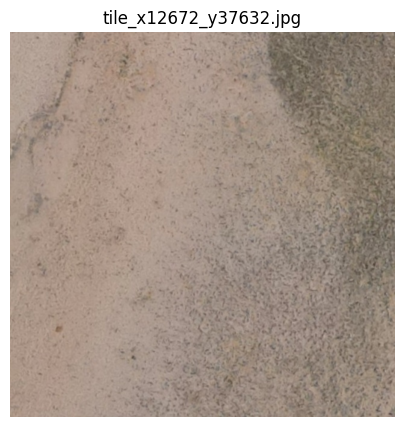

In [6]:
import os, random
from PIL import Image
import matplotlib.pyplot as plt

tile_dir = "/content/tiles_jpg/tiles_jpg"   # corrected path
tiles = [os.path.join(tile_dir, f) for f in os.listdir(tile_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.tif'))]

print(f"Found {len(tiles)} tiles")

for path in random.sample(tiles, min(4, len(tiles))):
    img = Image.open(path)
    plt.figure(figsize=(5,5))
    plt.imshow(img)
    plt.title(os.path.basename(path))
    plt.axis('off')
    plt.show()


In [7]:
# install Detectron2

try:
    import detectron2
    print("Detectron2 already installed.")
except Exception:
    !pip -q install "git+https://github.com/facebookresearch/detectron2.git"
    import detectron2
    print("Detectron2:", detectron2.__version__)


Detectron2 already installed.


In [8]:
!unzip -q /content/export_ready.zip -d /content/model_bundle
!ls -lh /content/model_bundle


unzip:  cannot find or open /content/export_ready.zip, /content/export_ready.zip.zip or /content/export_ready.zip.ZIP.
total 4.0K
drwxr-xr-x 2 root root 4.0K Nov  5 08:54 export_ready


In [9]:
# load model (edit CONFIG_PATH/WEIGHTS_PATH)

import os, torch
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor

# set these to wherever your export bundle is (Drive or /content)
# examples:
# CONFIG_PATH  = "/content/drive/MyDrive/export_ready/config_inference.yaml"
# WEIGHTS_PATH = "/content/drive/MyDrive/export_ready/model_final.pth"
CONFIG_PATH  = "/content/model_bundle/export_ready/config_inference.yaml"
WEIGHTS_PATH = "/content/model_bundle/export_ready/model_final.pth"


assert os.path.exists(CONFIG_PATH), f"Missing config: {CONFIG_PATH}"
assert os.path.exists(WEIGHTS_PATH), f"Missing weights: {WEIGHTS_PATH}"

cfg = get_cfg()
cfg.merge_from_file(CONFIG_PATH)
cfg.MODEL.WEIGHTS = WEIGHTS_PATH
cfg.MODEL.DEVICE  = "cuda" if torch.cuda.is_available() else "cpu"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.55  # tweak 0.3–0.7 as you like

predictor = DefaultPredictor(cfg)
print("Device:", cfg.MODEL.DEVICE)


Device: cuda


In [10]:
CONFIG_PATH  = "/content/model_bundle/export_ready/config_inference.yaml"
WEIGHTS_PATH = "/content/model_bundle/export_ready/model_final.pth"
IMG_DIR      = "/content/tiles_jpg/tiles_jpg"


In [11]:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6  # try 0.6 for fewer FPs


In [12]:
# in case I run out of cuda, fall back to cpu

import torch

# --- smart device selection ---
if torch.cuda.is_available():
    device = "cuda"
    gpu_name = torch.cuda.get_device_name(0)
    print(f" GPU available → using: {gpu_name}")
else:
    device = "cpu"
    print(" No GPU detected → falling back to CPU (this will be slower)")

# --- apply to Detectron2 config ---
cfg.MODEL.DEVICE = device


 GPU available → using: Tesla T4


In [13]:
# batch inference → CSV + overlays

import os, cv2, numpy as np, pandas as pd
from pathlib import Path
from tqdm.auto import tqdm
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog

IMG_DIR  = "/content/tiles_jpg/tiles_jpg"     # ← your tiles folder
OUT_VIZ  = "/content/out_viz"
os.makedirs(OUT_VIZ, exist_ok=True)

def is_boring(img, mean_thresh=245, std_thresh=3):
    g = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    m, s = float(g.mean()), float(g.std())
    return (m > mean_thresh or m < (255-mean_thresh)) or (s < std_thresh)

records, empties = [], []
jpgs = sorted([str(p) for p in Path(IMG_DIR).rglob("*.jpg")])
print(f"Found {len(jpgs)} JPG tiles in {IMG_DIR}")

# metadata is optional; if not set in cfg, we'll pass None
try:
    meta = MetadataCatalog.get(cfg.DATASETS.TRAIN[0]) if len(cfg.DATASETS.TRAIN) else None
except Exception:
    meta = None

for p in tqdm(jpgs, desc="Infer"):
    img = cv2.imread(p)
    if img is None:
        empties.append({"tile": os.path.basename(p), "reason": "read_failed"})
        continue

    # optional ultra-fast skip for near-white/black tiles
    if is_boring(img):
        empties.append({"tile": os.path.basename(p), "reason": "boring_skip"})
        continue

    out = predictor(img)
    inst = out["instances"].to("cpu")

    if len(inst) == 0:
        empties.append({"tile": os.path.basename(p), "reason": "no_detections"})
        continue

    boxes   = inst.pred_boxes.tensor.numpy() if inst.has("pred_boxes") else np.zeros((0,4))
    scores  = inst.scores.numpy() if inst.has("scores") else np.zeros((len(inst),))
    classes = inst.pred_classes.numpy() if inst.has("pred_classes") else np.zeros((len(inst),), dtype=int)

    # Faster R-CNN has boxes; if you trained masks, this will also work:
    areas = inst.pred_masks.numpy().sum(axis=(1,2)) if inst.has("pred_masks") else np.zeros((len(inst),))

    for i in range(len(inst)):
        x1, y1, x2, y2 = boxes[i].tolist() if len(boxes) else [0,0,0,0]
        records.append({
            "tile": os.path.basename(p),
            "score": float(scores[i]),
            "class": int(classes[i]),
            "x1": float(x1), "y1": float(y1), "x2": float(x2), "y2": float(y2),
            "bbox_w": float(x2-x1), "bbox_h": float(y2-y1),
            "mask_area_px": int(areas[i]) if len(areas) else 0,
        })

    # save overlay
    v = Visualizer(img[:, :, ::-1], metadata=meta, scale=1.0, instance_mode=ColorMode.IMAGE_BW)
    v = v.draw_instance_predictions(inst)
    cv2.imwrite(os.path.join(OUT_VIZ, Path(p).stem + "_viz.png"), v.get_image()[:, :, ::-1])

# save CSVs
det_df = pd.DataFrame.from_records(records)
empty_df = pd.DataFrame.from_records(empties)

det_csv   = "/content/detections.csv"
empty_csv = "/content/empty_or_skipped.csv"

det_df.to_csv(det_csv, index=False)
empty_df.to_csv(empty_csv, index=False)

print(f"Saved: {det_csv}  ({len(det_df)} detections from {det_df['tile'].nunique()} tiles)")
print(f"Saved: {empty_csv} ({len(empty_df)} tiles empty/skipped)")
print(f"Viz → {OUT_VIZ}")


Found 23505 JPG tiles in /content/tiles_jpg/tiles_jpg


Infer:   0%|          | 0/23505 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4322.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Saved: /content/detections.csv  (1404 detections from 1173 tiles)
Saved: /content/empty_or_skipped.csv (22332 tiles empty/skipped)
Viz → /content/out_viz


Showing 10 random detection previews:



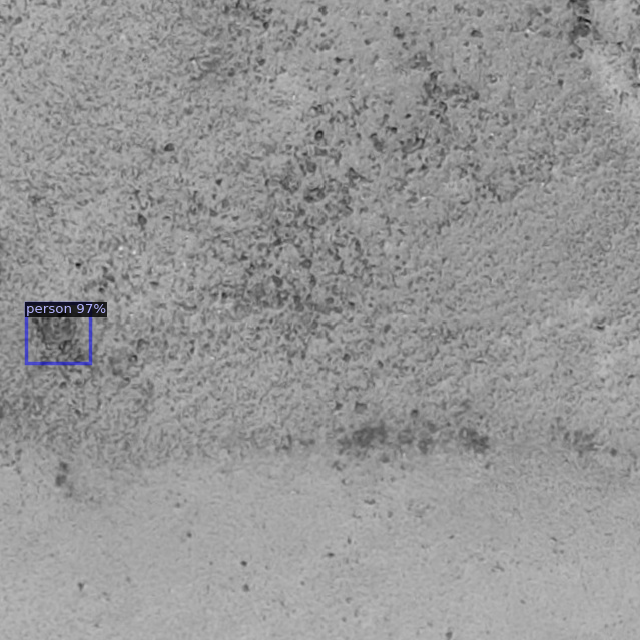

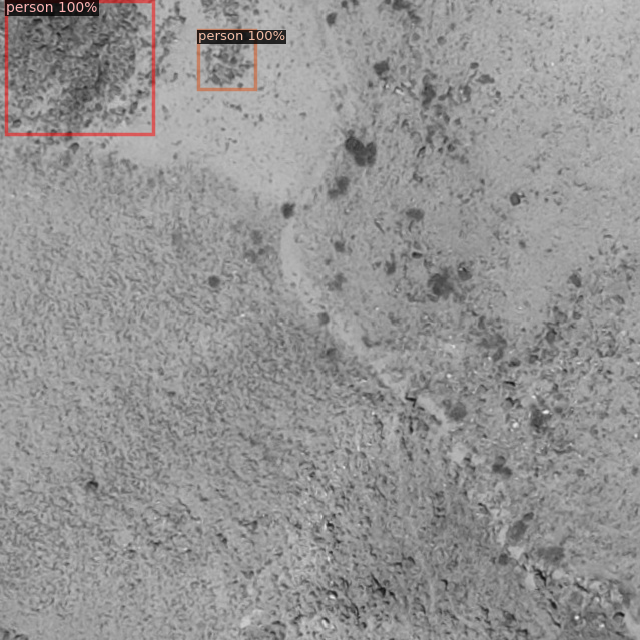

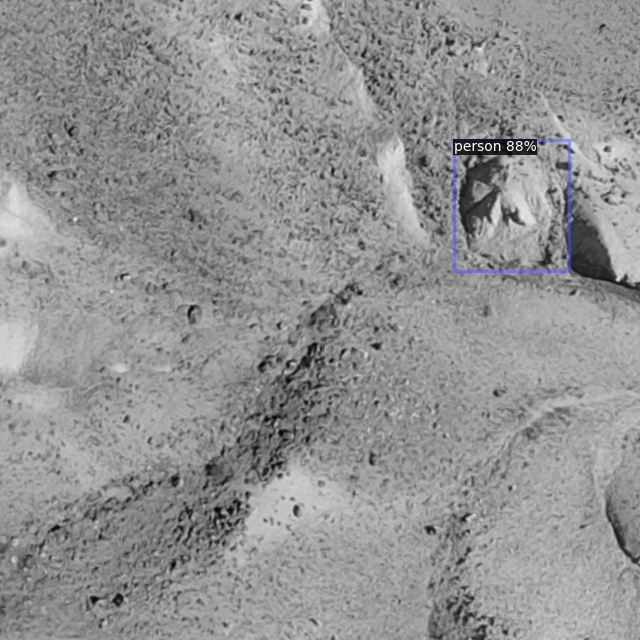

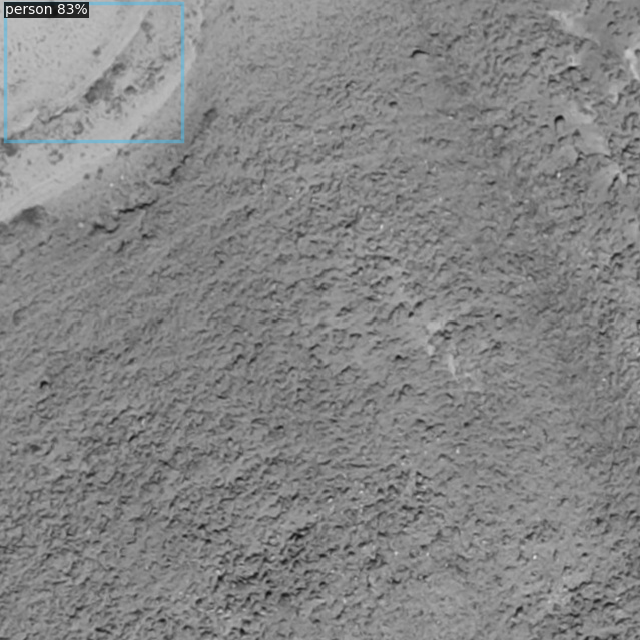

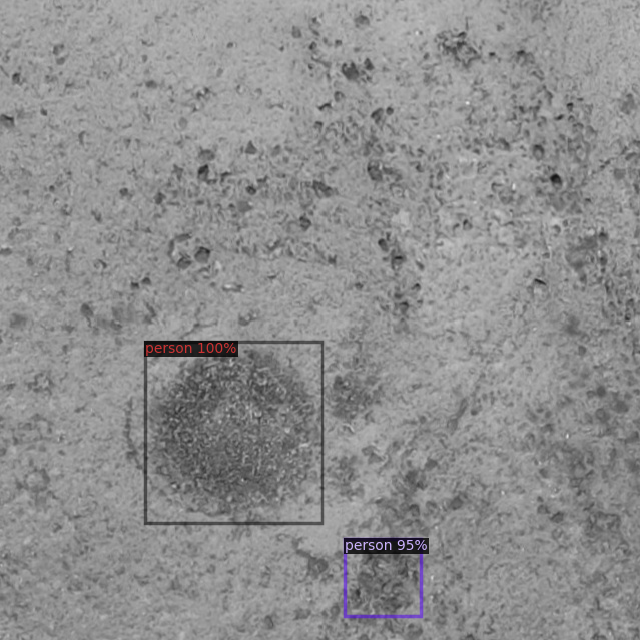

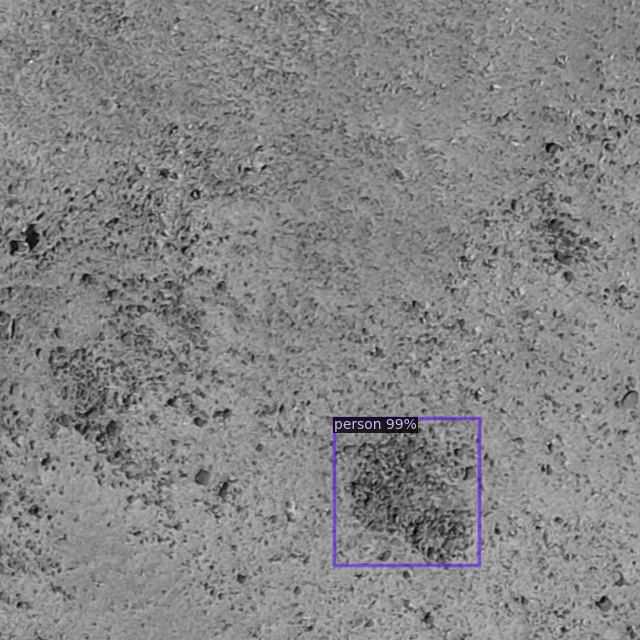

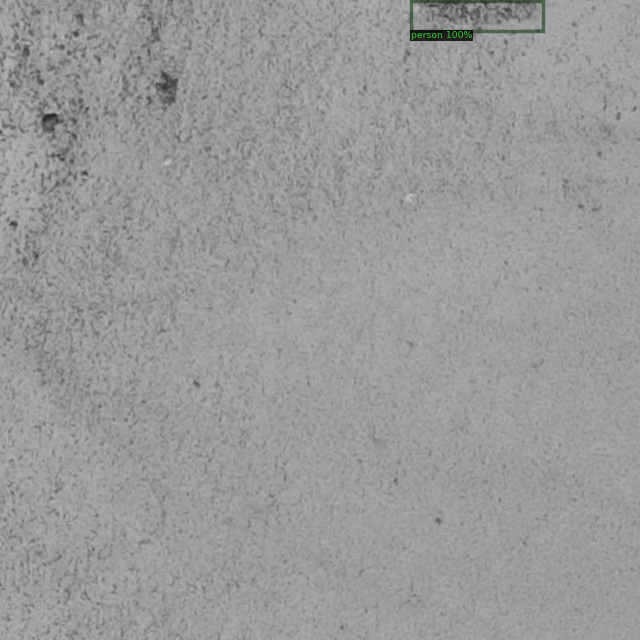

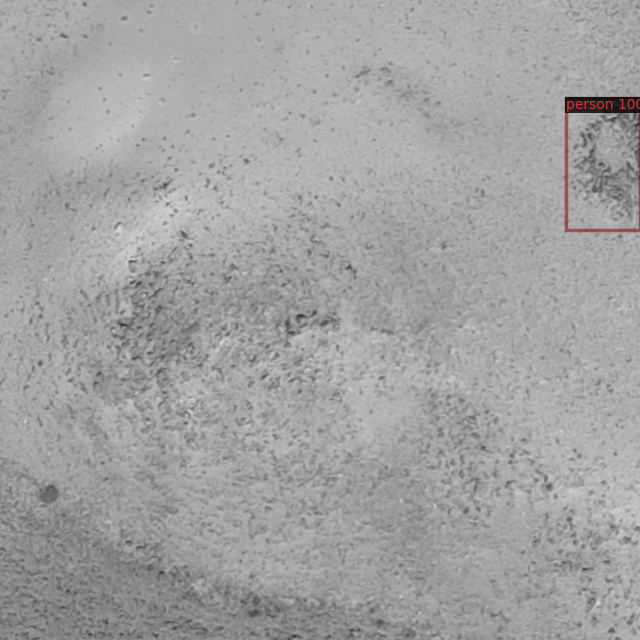

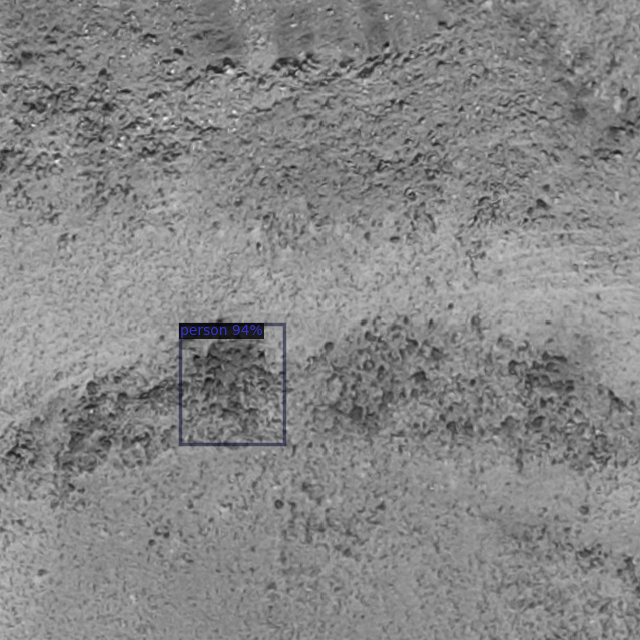

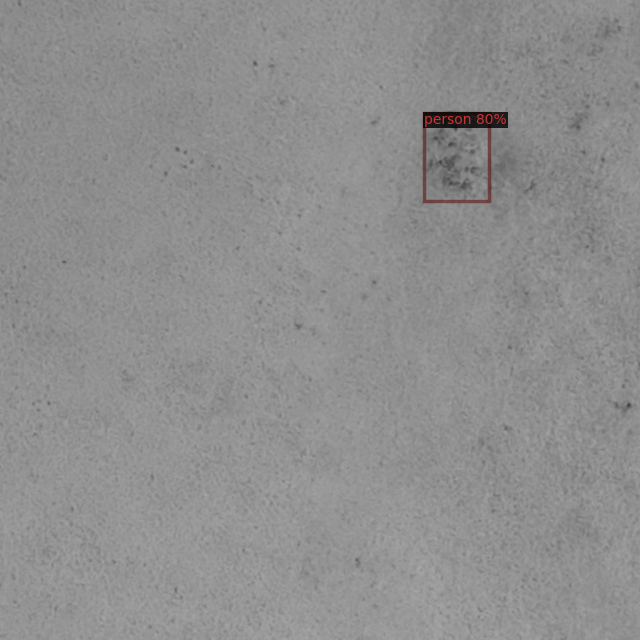

In [14]:
# show 10 random detections

import random, os
from IPython.display import Image, display

# Path to your visualization folder
viz_dir = "/content/out_viz"

# List all PNGs that contain detections
viz_files = [f for f in os.listdir(viz_dir) if f.endswith("_viz.png")]

# Show 10 random ones (or fewer if less available)
sample = random.sample(viz_files, min(10, len(viz_files)))

print(f"Showing {len(sample)} random detection previews:\n")

for f in sample:
    display(Image(filename=os.path.join(viz_dir, f)))


# Let's fix this 'person' thing and run only on part of the tiles_jpg

uses “mound” label in overlays

skips tiles already processed (found in CSVs or with an existing _viz.png)

runs on up to 10,000 tiles (random, reproducible sample from remaining)

appends & de-duplicates the CSVs so you can safely resume anytime

In [15]:
# --- Batch inference (resume-safe) → CSV + overlays (Detectron2) ---
import os, cv2, zipfile, time, random
from pathlib import Path
import numpy as np
import pandas as pd
from tqdm import tqdm

from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog

# ------------------ paths & settings ------------------
TILES_DIR   = "/content/tiles_jpg/tiles_jpg"                 # folder with JPG/PNG tiles
OUT_VIZ     = "/content/out_viz"                             # overlay PNGs here

#  your exported model lives here:
MODEL_DIR   = "/content/model_bundle/export_ready"
CFG_PATH    = f"{MODEL_DIR}/config.yaml"                     # update if different
WEIGHTS     = f"{MODEL_DIR}/model_final.pth"

CLASSES     = ["mound"]                                      # your class names
SCORE_TH    = 0.50
BATCH_SIZE  = 10_000                                         # run on up to 10k tiles
SAVE_ZIP    = "/content/export_ready.zip"
DET_CSV     = "/content/detections.csv"
EMPTY_CSV   = "/content/empty_or_skipped.csv"

# ------------------ sanity checks ------------------
assert os.path.isfile(WEIGHTS), f"Weights not found: {WEIGHTS}"
if not os.path.isfile(CFG_PATH):
    print(f" config.yaml not found at {CFG_PATH}. Proceeding without merge_from_file(). "
          "Ensure cfg matches training (NUM_CLASSES, input size, etc).")

# ------------------ build predictor ------------------
cfg = get_cfg()
if os.path.isfile(CFG_PATH):
    cfg.merge_from_file(CFG_PATH)

cfg.MODEL.WEIGHTS = WEIGHTS
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = SCORE_TH
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(CLASSES)               # ensure correct classes
predictor = DefaultPredictor(cfg)

# Visualizer metadata -> show "mound" instead of COCO "person"
meta_name = "inference_meta"
if meta_name not in MetadataCatalog.list():
    MetadataCatalog.get(meta_name).thing_classes = CLASSES
meta = MetadataCatalog.get(meta_name)

# ------------------ gather tiles ------------------
Path(OUT_VIZ).mkdir(parents=True, exist_ok=True)

all_tiles = sorted(
    [str(p) for p in Path(TILES_DIR).glob("*.jpg")] +
    [str(p) for p in Path(TILES_DIR).glob("*.jpeg")] +
    [str(p) for p in Path(TILES_DIR).glob("*.png")]
)

# Already processed: read existing CSVs + existing _viz images
processed_tiles = set()
if os.path.exists(DET_CSV):
    try:
        processed_tiles.update(pd.read_csv(DET_CSV)["tile"].unique().tolist())
    except Exception:
        pass
if os.path.exists(EMPTY_CSV):
    try:
        processed_tiles.update(pd.read_csv(EMPTY_CSV)["tile"].unique().tolist())
    except Exception:
        pass

# also skip if overlay PNG already exists for that tile stem
existing_viz_stems = {Path(p).stem.replace("_viz", "") for p in Path(OUT_VIZ).glob("*_viz.png")}
remaining = [t for t in all_tiles if (t not in processed_tiles) and (Path(t).stem not in existing_viz_stems)]

print(f"Total tiles: {len(all_tiles)}")
print(f"Already processed/skipped: {len(processed_tiles)}")
print(f"Remaining: {len(remaining)}")

# Sample up to 10k from remaining, randomly but reproducibly
random.seed(42)
tiles = random.sample(remaining, min(BATCH_SIZE, len(remaining)))
print(f"\n→ Will run inference on {len(tiles)} tiles")

# ------------------ run inference ------------------
new_records, new_empties = [], []
t0 = time.time()

for p in tqdm(tiles, desc="Infer", unit="img"):
    img = cv2.imread(p, cv2.IMREAD_COLOR)
    if img is None:
        new_empties.append({"tile": p, "reason": "read_error"})
        continue

    # quick filter to drop almost solid tiles (optional)
    if float(img.std()) < 4.0:
        new_empties.append({"tile": p, "reason": "low_std"})
        continue

    outputs = predictor(img)
    inst = outputs["instances"].to("cpu")
    n = len(inst) if inst.has("scores") else 0

    if n == 0:
        new_empties.append({"tile": p, "reason": "no_detections"})
        continue

    boxes   = inst.pred_boxes.tensor.numpy()
    scores  = inst.scores.numpy()
    classes = inst.pred_classes.numpy()

    for i in range(n):
        x1, y1, x2, y2 = boxes[i].tolist()
        cid = int(classes[i])
        cname = CLASSES[cid] if 0 <= cid < len(CLASSES) else f"class_{cid}"
        new_records.append({
            "tile": p,
            "x1": x1, "y1": y1, "x2": x2, "y2": y2,
            "width": img.shape[1], "height": img.shape[0],
            "score": float(scores[i]),
            "class_id": cid,
            "class": cname,
        })

    # overlay with label "mound"
    v = Visualizer(img[:, :, ::-1], metadata=meta, scale=1.0, instance_mode=ColorMode.IMAGE_BW)
    v = v.draw_instance_predictions(inst)
    out_png = os.path.join(OUT_VIZ, Path(p).stem + "_viz.png")
    cv2.imwrite(out_png, v.get_image()[:, :, ::-1])

# ------------------ merge with existing CSVs (append + dedup) ------------------
det_df_new  = pd.DataFrame.from_records(new_records)
emp_df_new  = pd.DataFrame.from_records(new_empties)

if os.path.exists(DET_CSV):
    try:
        det_df_old = pd.read_csv(DET_CSV)
        det_df = pd.concat([det_df_old, det_df_new], ignore_index=True)
        det_df = det_df.drop_duplicates(subset=["tile","x1","y1","x2","y2","score","class_id"])
    except Exception:
        det_df = det_df_new
else:
    det_df = det_df_new

if os.path.exists(EMPTY_CSV):
    try:
        emp_df_old = pd.read_csv(EMPTY_CSV)
        emp_df = pd.concat([emp_df_old, emp_df_new], ignore_index=True)
        emp_df = emp_df.drop_duplicates(subset=["tile","reason"])
    except Exception:
        emp_df = emp_df_new
else:
    emp_df = emp_df_new

det_df.to_csv(DET_CSV, index=False)
emp_df.to_csv(EMPTY_CSV, index=False)

print(f"\nSaved: {DET_CSV}  ({len(det_df)} rows from {det_df['tile'].nunique() if len(det_df) else 0} tiles)")
print(f"Saved: {EMPTY_CSV}  ({len(emp_df)} rows)")
print(f"Viz  → {OUT_VIZ}")

# ------------------ zip for download ------------------
with zipfile.ZipFile(SAVE_ZIP, "w", compression=zipfile.ZIP_DEFLATED) as z:
    z.write(DET_CSV, arcname=Path(DET_CSV).name)
    z.write(EMPTY_CSV, arcname=Path(EMPTY_CSV).name)
    for png in Path(OUT_VIZ).glob("*.png"):
        z.write(str(png), arcname=f"out_viz/{png.name}")

mins = int((time.time() - t0)//60)
print(f"\n Batch complete in ~{mins} min → {SAVE_ZIP}")


 config.yaml not found at /content/model_bundle/export_ready/config.yaml. Proceeding without merge_from_file(). Ensure cfg matches training (NUM_CLASSES, input size, etc).


backbone.res2.0.conv1.norm.{bias, weight}
backbone.res2.0.conv1.weight
backbone.res2.0.conv2.norm.{bias, weight}
backbone.res2.0.conv2.weight
backbone.res2.0.conv3.norm.{bias, weight}
backbone.res2.0.conv3.weight
backbone.res2.0.shortcut.norm.{bias, weight}
backbone.res2.0.shortcut.weight
backbone.res2.1.conv1.norm.{bias, weight}
backbone.res2.1.conv1.weight
backbone.res2.1.conv2.norm.{bias, weight}
backbone.res2.1.conv2.weight
backbone.res2.1.conv3.norm.{bias, weight}
backbone.res2.1.conv3.weight
backbone.res2.2.conv1.norm.{bias, weight}
backbone.res2.2.conv1.weight
backbone.res2.2.conv2.norm.{bias, weight}
backbone.res2.2.conv2.weight
backbone.res2.2.conv3.norm.{bias, weight}
backbone.res2.2.conv3.weight
backbone.res3.0.conv1.norm.{bias, weight}
backbone.res3.0.conv1.weight
backbone.res3.0.conv2.norm.{bias, weight}
backbone.res3.0.conv2.weight
backbone.res3.0.conv3.norm.{bias, weight}
backbone.res3.0.conv3.weight
backbone.res3.0.shortcut.norm.{bias, weight}
backbone.res3.0.shortcut.w

Total tiles: 22284
Already processed/skipped: 23505
Remaining: 21111

→ Will run inference on 10000 tiles


Infer: 100%|██████████| 10000/10000 [12:42<00:00, 13.12img/s]



Saved: /content/detections.csv  (6441 rows from 2568 tiles)
Saved: /content/empty_or_skipped.csv  (30937 rows)
Viz  → /content/out_viz

 Batch complete in ~14 min → /content/export_ready.zip


# I want to have the detections georeferenced, so in that order I need to make a portable detections CSV (pixel-space bboxes _ tile stem), then join them with the matching GeoTiffs to produce a GeoJSON or Shapefile

In [16]:
# this creates detections_portable.csv with just what we need to georeference later (no paths that only exist in Colab

# Make a portable detections CSV (pixel bboxes + tile stem)
import pandas as pd
from pathlib import Path

DET_CSV = "/content/detections.csv"   # your existing detections
OUT_CSV = "/content/detections_portable.csv"

df = pd.read_csv(DET_CSV)

# normalize column names (keep originals if already lowercased)
lower = {c.lower(): c for c in df.columns}
def C(name): return lower.get(name, name)

required = ["tile","x1","y1","x2","y2","width","height"]
missing = [c for c in required if C(c) not in df.columns]
if missing:
    raise ValueError(f"Missing columns in detections.csv: {missing}")

df["tile_stem"] = df[C("tile")].apply(lambda p: Path(p).stem)

portable = df[[C("tile"), "tile_stem", C("x1"), C("y1"), C("x2"), C("y2"), C("width"), C("height")]].copy()
# Keep scores/classes if present
for extra in ["score","class","class_id"]:
    if C(extra) in df.columns and C(extra) not in portable.columns:
        portable[extra] = df[C(extra)]

portable.to_csv(OUT_CSV, index=False)
print(f" Wrote {OUT_CSV}  ({len(portable)} rows)")


 Wrote /content/detections_portable.csv  (6441 rows)


If you later want georeferenced outputs (GeoJSON in map coordinates), we can run inference locally over the original GeoTIFF tiles and map detections back using each tile’s affine transform.